In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [1]:
# INSTALLING REQUIRED LIBRARIES
!pip install -U pyproj -q
!pip install -U utm -q
!pip install -U google-colab -q
!pip install -U tornado -q
!pip install geemap -q
!pip install wxee

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires tornado==6.4.2, but you have tornado 6.5.1 which is incompatible.


In [2]:
# !earthengine authenticate
import ee
import os

# Set the path to the service account key file
service_account = 'editor@ee-manmeet20singh15-wbis.iam.gserviceaccount.com'
key_file = 'drive/MyDrive/earth_engine/ee-manmeet20singh15-wbis-fab7f1ca35e0.json'

# Use the service account for authentication
credentials = ee.ServiceAccountCredentials(service_account, key_file)
ee.Initialize(credentials)

In [3]:
import ee
import wxee
#wxee.Initialize()

In [4]:
lat_diff = 0
lon_diff = 0

aoi = ee.Geometry.Polygon(
        [[[60, 5],
          [100, 5],
          [100, 40],
          [60, 40],
          [60, 5]]])

In [5]:
coords = aoi.coordinates().getInfo()[0]
coords

[[60, 5], [100, 5], [100, 40], [60, 40], [60, 5]]

In [8]:
start_date = '2000-01-01'
end_date = '2000-12-31'
dataset = ee.ImageCollection('MODIS/061/MCD19A2_GRANULES') \
            .filterDate(start_date, end_date).select('Optical_Depth_055').mean()
dataset = dataset.set('system:time_start', ee.Date(start_date).millis())
ds_aod_modis = dataset.wx.to_xarray(region=aoi.bounds(), scale=25000)

Downloading:   0%|          | 0.00/137k [00:00<?, ?iB/s]

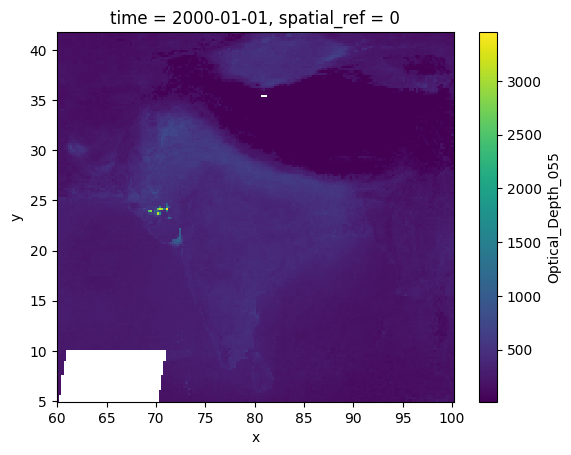

In [ ]:
ds_aod_modis.Optical_Depth_055.plot()

In [ ]:
from tqdm import tqdm
import xarray as xr
import pandas as pd
# List to store yearly datasets
yearly_datasets = []

for year in tqdm(range(2000, 2025)):
    try:
        start_date = f"{year}-01-01"
        end_date = f"{year}-12-31"

        dataset = (
            ee.ImageCollection("MODIS/061/MCD19A2_GRANULES")
            .filterDate(start_date, end_date)
            .select("Optical_Depth_055")
            .mean()
        )

        dataset = dataset.set("system:time_start", ee.Date(start_date).millis())

        ds = dataset.wx.to_xarray(region=aoi.bounds(), scale=25000)

        # Add time only if not present
        if "time" not in ds.dims:
            ds = ds.expand_dims(time=[pd.to_datetime(start_date)])

        yearly_datasets.append(ds)
    except Exception as e:
        print(f"Failed for year {year}: {e}")
# Concatenate all years into a single xarray dataset
ds_aod_modis = xr.concat(yearly_datasets, dim="time")

  0%|          | 0/25 [00:00<?, ?it/s]

Downloading:   0%|          | 0.00/137k [00:00<?, ?iB/s]

  4%|▍         | 1/25 [01:25<34:14, 85.61s/it]

Downloading:   0%|          | 0.00/144k [00:00<?, ?iB/s]

  8%|▊         | 2/25 [10:54<2:21:50, 370.00s/it]

Downloading:   0%|          | 0.00/154k [00:00<?, ?iB/s]

 12%|█▏        | 3/25 [13:20<1:38:05, 267.52s/it]

Downloading:   0%|          | 0.00/174k [00:00<?, ?iB/s]

 16%|█▌        | 4/25 [17:56<1:34:48, 270.86s/it]

Downloading:   0%|          | 0.00/165k [00:00<?, ?iB/s]

 20%|██        | 5/25 [21:24<1:22:45, 248.28s/it]

Downloading:   0%|          | 0.00/164k [00:00<?, ?iB/s]

 28%|██▊       | 7/25 [27:51<1:02:08, 207.13s/it]

Failed for year 2006: 503 Server Error: Service Unavailable for url: https://earthengine.googleapis.com/v1/projects/earthengine-legacy/thumbnails/81fa2b562f5eddf2842cb696e911282d-99b8c7dd441b499c17561fbec314be07:getPixels


Downloading:   0%|          | 0.00/166k [00:00<?, ?iB/s]

 32%|███▏      | 8/25 [31:55<1:02:03, 219.02s/it]

Downloading:   0%|          | 0.00/171k [00:00<?, ?iB/s]

 36%|███▌      | 9/25 [37:47<1:09:28, 260.53s/it]

Downloading:   0%|          | 0.00/166k [00:00<?, ?iB/s]

 40%|████      | 10/25 [41:57<1:04:21, 257.40s/it]

Downloading:   0%|          | 0.00/163k [00:00<?, ?iB/s]

 44%|████▍     | 11/25 [45:22<56:19, 241.37s/it]  

Downloading:   0%|          | 0.00/165k [00:00<?, ?iB/s]

 48%|████▊     | 12/25 [49:53<54:14, 250.35s/it]

Downloading:   0%|          | 0.00/164k [00:00<?, ?iB/s]

 52%|█████▏    | 13/25 [54:32<51:49, 259.10s/it]

Downloading:   0%|          | 0.00/163k [00:00<?, ?iB/s]

 56%|█████▌    | 14/25 [58:45<47:09, 257.23s/it]

Downloading:   0%|          | 0.00/164k [00:00<?, ?iB/s]

 60%|██████    | 15/25 [1:02:58<42:37, 255.72s/it]

Downloading:   0%|          | 0.00/164k [00:00<?, ?iB/s]

 64%|██████▍   | 16/25 [1:06:17<35:47, 238.62s/it]

Downloading:   0%|          | 0.00/165k [00:00<?, ?iB/s]

 68%|██████▊   | 17/25 [1:10:30<32:25, 243.21s/it]

Downloading:   0%|          | 0.00/166k [00:00<?, ?iB/s]

 72%|███████▏  | 18/25 [1:16:26<32:18, 276.93s/it]

Downloading:   0%|          | 0.00/164k [00:00<?, ?iB/s]

 76%|███████▌  | 19/25 [1:19:47<25:25, 254.28s/it]

Downloading:   0%|          | 0.00/163k [00:00<?, ?iB/s]

 80%|████████  | 20/25 [1:28:12<27:26, 329.36s/it]

Downloading:   0%|          | 0.00/164k [00:00<?, ?iB/s]

 84%|████████▍ | 21/25 [1:32:45<20:50, 312.66s/it]

Downloading:   0%|          | 0.00/163k [00:00<?, ?iB/s]

 88%|████████▊ | 22/25 [1:36:19<14:09, 283.08s/it]

Downloading:   0%|          | 0.00/170k [00:00<?, ?iB/s]

 92%|█████████▏| 23/25 [1:41:39<09:48, 294.15s/it]

Downloading:   0%|          | 0.00/164k [00:00<?, ?iB/s]

 96%|█████████▌| 24/25 [1:49:19<05:43, 343.63s/it]

Downloading:   0%|          | 0.00/161k [00:00<?, ?iB/s]

100%|██████████| 25/25 [1:53:03<00:00, 271.35s/it]


In [ ]:
ds_aod_modis.to_netcdf('drive/MyDrive/earth_engine/aod_modis.nc')

In [ ]:
ds_aod_modis_anom = (ds_aod_modis - ds_aod_modis.mean(dim='time'))/1000

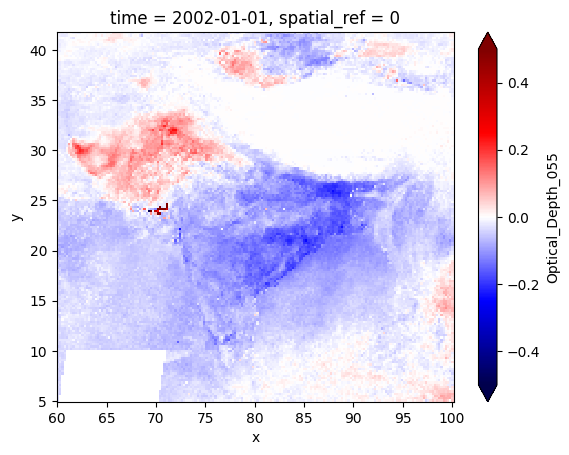

In [ ]:
ds_aod_modis_anom.sel(time='2002-01-01').Optical_Depth_055.plot(vmin=-0.5, vmax=0.5, cmap='seismic')

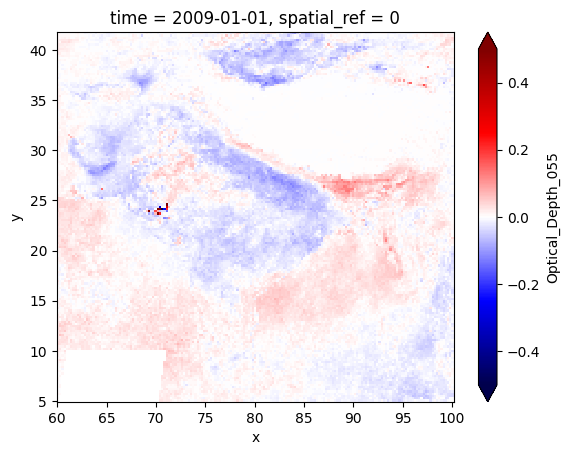

In [ ]:
ds_aod_modis_anom.sel(time='2009-01-01').Optical_Depth_055.plot(vmin=-0.5, vmax=0.5, cmap='seismic')

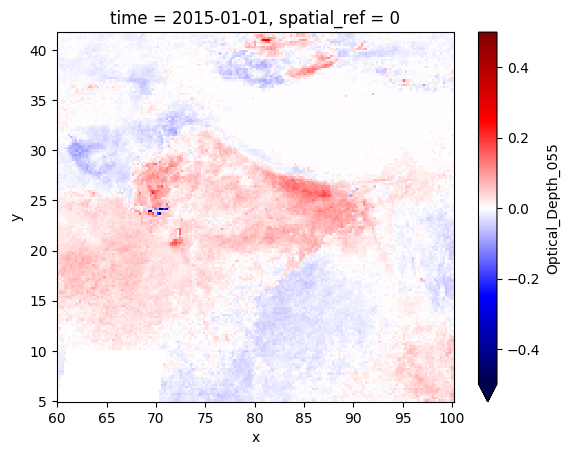

In [ ]:
ds_aod_modis_anom.sel(time='2015-01-01').Optical_Depth_055.plot(vmin=-0.5, vmax=0.5, cmap='seismic')

In [ ]:
from tqdm import tqdm
import xarray as xr
import pandas as pd
# List to store yearly datasets
yearly_datasets = []

for year in tqdm(range(1979, 2022)):
    try:
        start_date = f"{year}-01-01"
        end_date = f"{year}-12-31"

        dataset = (
            ee.ImageCollection("NOAA/CDR/PATMOSX/V53")
            .filterDate(start_date, end_date)
            .select("cloud_type")
            .mode()
        )

        dataset = dataset.set("system:time_start", ee.Date(start_date).millis())

        ds = dataset.wx.to_xarray(region=aoi.bounds(), scale=25000)

        # Add time only if not present
        if "time" not in ds.dims:
            ds = ds.expand_dims(time=[pd.to_datetime(start_date)])

        yearly_datasets.append(ds)
    except Exception as e:
        print(f"Failed for year {year}: {e}")
# Concatenate all years into a single xarray dataset
ds_aod_avhrr = xr.concat(yearly_datasets, dim="time")

  0%|          | 0/43 [00:00<?, ?it/s]

Downloading:   0%|          | 0.00/3.03k [00:00<?, ?iB/s]

  2%|▏         | 1/43 [00:06<04:49,  6.89s/it]

Downloading:   0%|          | 0.00/3.89k [00:00<?, ?iB/s]

  5%|▍         | 2/43 [00:10<03:29,  5.10s/it]

Downloading:   0%|          | 0.00/3.07k [00:00<?, ?iB/s]

  7%|▋         | 3/43 [00:19<04:26,  6.67s/it]

Downloading:   0%|          | 0.00/2.16k [00:00<?, ?iB/s]

  9%|▉         | 4/43 [00:26<04:27,  6.86s/it]

Downloading:   0%|          | 0.00/2.23k [00:00<?, ?iB/s]

 12%|█▏        | 5/43 [00:35<04:46,  7.53s/it]

Downloading:   0%|          | 0.00/2.28k [00:00<?, ?iB/s]

 14%|█▍        | 6/43 [00:43<04:42,  7.64s/it]

Downloading:   0%|          | 0.00/2.52k [00:00<?, ?iB/s]

 16%|█▋        | 7/43 [00:52<04:51,  8.09s/it]

Downloading:   0%|          | 0.00/2.17k [00:00<?, ?iB/s]

 19%|█▊        | 8/43 [01:01<04:59,  8.56s/it]

Downloading:   0%|          | 0.00/2.00k [00:00<?, ?iB/s]

 21%|██        | 9/43 [01:13<05:26,  9.61s/it]

Downloading:   0%|          | 0.00/2.27k [00:00<?, ?iB/s]

 23%|██▎       | 10/43 [01:26<05:46, 10.51s/it]

Downloading:   0%|          | 0.00/1.99k [00:00<?, ?iB/s]

 26%|██▌       | 11/43 [01:35<05:28, 10.26s/it]

Downloading:   0%|          | 0.00/2.37k [00:00<?, ?iB/s]

 28%|██▊       | 12/43 [01:52<06:21, 12.32s/it]

Downloading:   0%|          | 0.00/2.16k [00:00<?, ?iB/s]

 30%|███       | 13/43 [02:04<06:06, 12.22s/it]

Downloading:   0%|          | 0.00/2.16k [00:00<?, ?iB/s]

 33%|███▎      | 14/43 [02:15<05:39, 11.70s/it]

Downloading:   0%|          | 0.00/2.18k [00:00<?, ?iB/s]

 35%|███▍      | 15/43 [02:25<05:13, 11.19s/it]

Downloading:   0%|          | 0.00/2.42k [00:00<?, ?iB/s]

 37%|███▋      | 16/43 [02:30<04:17,  9.55s/it]

Downloading:   0%|          | 0.00/2.20k [00:00<?, ?iB/s]

 40%|███▉      | 17/43 [02:43<04:29, 10.35s/it]

Downloading:   0%|          | 0.00/2.25k [00:00<?, ?iB/s]

 42%|████▏     | 18/43 [02:55<04:29, 10.80s/it]

Downloading:   0%|          | 0.00/2.33k [00:00<?, ?iB/s]

 44%|████▍     | 19/43 [03:12<05:04, 12.70s/it]

Downloading:   0%|          | 0.00/2.43k [00:00<?, ?iB/s]

 47%|████▋     | 20/43 [03:26<05:02, 13.16s/it]

Downloading:   0%|          | 0.00/2.21k [00:00<?, ?iB/s]

 49%|████▉     | 21/43 [03:43<05:15, 14.36s/it]

Downloading:   0%|          | 0.00/2.20k [00:00<?, ?iB/s]

 51%|█████     | 22/43 [03:58<05:08, 14.69s/it]

Downloading:   0%|          | 0.00/2.45k [00:00<?, ?iB/s]

 53%|█████▎    | 23/43 [04:25<06:02, 18.14s/it]

Downloading:   0%|          | 0.00/2.30k [00:00<?, ?iB/s]

 56%|█████▌    | 24/43 [04:53<06:43, 21.22s/it]

Downloading:   0%|          | 0.00/2.17k [00:00<?, ?iB/s]

 58%|█████▊    | 25/43 [06:20<12:17, 40.96s/it]

Downloading:   0%|          | 0.00/2.01k [00:00<?, ?iB/s]

 60%|██████    | 26/43 [06:43<10:04, 35.57s/it]

Downloading:   0%|          | 0.00/2.07k [00:00<?, ?iB/s]

 63%|██████▎   | 27/43 [07:44<11:28, 43.03s/it]

Downloading:   0%|          | 0.00/1.89k [00:00<?, ?iB/s]

 65%|██████▌   | 28/43 [08:16<09:58, 39.88s/it]

Downloading:   0%|          | 0.00/1.93k [00:00<?, ?iB/s]

 67%|██████▋   | 29/43 [08:42<08:20, 35.74s/it]

Downloading:   0%|          | 0.00/1.99k [00:00<?, ?iB/s]

 70%|██████▉   | 30/43 [11:08<14:55, 68.88s/it]

Downloading:   0%|          | 0.00/1.92k [00:00<?, ?iB/s]

 72%|███████▏  | 31/43 [11:36<11:18, 56.50s/it]

Downloading:   0%|          | 0.00/2.10k [00:00<?, ?iB/s]

 74%|███████▍  | 32/43 [13:10<12:23, 67.63s/it]

Downloading:   0%|          | 0.00/1.89k [00:00<?, ?iB/s]

 77%|███████▋  | 33/43 [14:38<12:18, 73.88s/it]

Downloading:   0%|          | 0.00/1.88k [00:00<?, ?iB/s]

 79%|███████▉  | 34/43 [15:38<10:26, 69.56s/it]

Downloading:   0%|          | 0.00/1.82k [00:00<?, ?iB/s]

 81%|████████▏ | 35/43 [16:49<09:22, 70.26s/it]

Downloading:   0%|          | 0.00/1.98k [00:00<?, ?iB/s]

 84%|████████▎ | 36/43 [18:19<08:52, 76.14s/it]

Downloading:   0%|          | 0.00/2.04k [00:00<?, ?iB/s]

 86%|████████▌ | 37/43 [19:02<06:36, 66.07s/it]

Downloading:   0%|          | 0.00/2.11k [00:00<?, ?iB/s]

 88%|████████▊ | 38/43 [20:02<05:21, 64.23s/it]

Downloading:   0%|          | 0.00/2.04k [00:00<?, ?iB/s]

 91%|█████████ | 39/43 [20:50<03:57, 59.36s/it]

Downloading:   0%|          | 0.00/1.98k [00:00<?, ?iB/s]

 93%|█████████▎| 40/43 [21:39<02:48, 56.31s/it]

Downloading:   0%|          | 0.00/1.95k [00:00<?, ?iB/s]

 95%|█████████▌| 41/43 [22:20<01:43, 51.61s/it]

Downloading:   0%|          | 0.00/2.14k [00:00<?, ?iB/s]

 98%|█████████▊| 42/43 [23:05<00:49, 49.66s/it]

Downloading:   0%|          | 0.00/2.13k [00:00<?, ?iB/s]

100%|██████████| 43/43 [23:48<00:00, 33.23s/it]


In [ ]:
ds_aod_avhrr.to_netcdf('drive/MyDrive/earth_engine/aod_avhrr.nc')

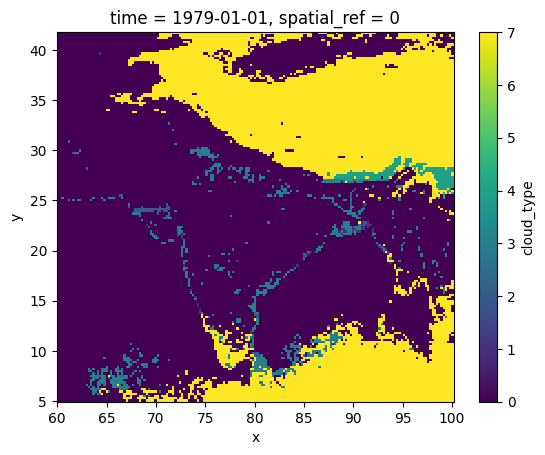

In [ ]:
ds_aod_avhrr.isel(time=0).cloud_type.plot()

In [ ]:
ds_aod_avhrr_dust = (ds_aod_avhrr >7 ) and (ds_aod_avhrr < 8)

In [ ]:
ds_aod_avhrr_dust

<xarray.Dataset> Size: 1MB
Dimensions:      (time: 43, x: 179, y: 164)
Coordinates:
  * time         (time) datetime64[ns] 344B 1979-01-01 1980-01-01 ... 2021-01-01
  * x            (x) float64 1kB 60.07 60.3 60.52 60.75 ... 99.6 99.83 100.0
  * y            (y) float64 1kB 41.66 41.43 41.21 40.99 ... 5.502 5.278 5.053
    spatial_ref  int64 8B 0
Data variables:
    cloud_type   (time, y, x) bool 1MB True True True True ... True True True
Attributes:
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    AREA_OR_POINT:           Area
    _FillValue:              -32768
    scale_factor:            1.0
    add_offset:              0.0

# Precipitation and Soil Moisture from ERA5

In [2]:
!pip install --no-cache-dir zarr==2.14.2 numcodecs==0.11.0

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.3/203.3 kB 17.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 145.4 MB/s eta 0:00:00
  Created wheel for asciitree: filename=asciitree-0.3.3-py3-none-any.whl size=5031 sha256=4e6ea3541b4b1eabe08d24f0b3d0bf5a81ad36514b5d2eff488bd66fc4cb1fc0
  Stored in directory: /tmp/pip-ephem-wheel-cache-1gbh2rfy/wheels/71/c1/da/23077eb3b87d24d6f3852ed1ed1a1ac2d3c885ad6ebd2b4a07
Successfully built asciitree


In [3]:
import fsspec

fs = fsspec.filesystem('gs', token='anon')
fs.ls('gs://gcp-public-data-arco-era5/co/')

['gcp-public-data-arco-era5/co/model-level-moisture.zarr',
 'gcp-public-data-arco-era5/co/model-level-moisture.zarr-v2',
 'gcp-public-data-arco-era5/co/model-level-wind.zarr',
 'gcp-public-data-arco-era5/co/model-level-wind.zarr-v2',
 'gcp-public-data-arco-era5/co/single-level-forecast.zarr',
 'gcp-public-data-arco-era5/co/single-level-forecast.zarr-v2',
 'gcp-public-data-arco-era5/co/single-level-reanalysis.zarr',
 'gcp-public-data-arco-era5/co/single-level-reanalysis.zarr-v2',
 'gcp-public-data-arco-era5/co/single-level-surface.zarr',
 'gcp-public-data-arco-era5/co/single-level-surface.zarr-v2']

In [4]:
import fsspec
import xarray as xr

reanalysis = xr.open_zarr(
    'gs://gcp-public-data-arco-era5/co/single-level-reanalysis.zarr',
    chunks={'time': 48},storage_options={'token': 'anon'},
    consolidated=True
)
reanalysis

<ipython-input-4-2071a4745a9f>:4: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  reanalysis = xr.open_zarr(


<xarray.Dataset> Size: 31TB
Dimensions:              (time: 374016, values: 542080)
Coordinates:
    depthBelowLandLayer  float64 8B ...
    entireAtmosphere     float64 8B ...
    latitude             (values) float64 4MB dask.array<chunksize=(542080,), meta=np.ndarray>
    longitude            (values) float64 4MB dask.array<chunksize=(542080,), meta=np.ndarray>
    number               int64 8B ...
    step                 timedelta64[ns] 8B ...
    surface              float64 8B ...
  * time                 (time) datetime64[ns] 3MB 1979-01-01 ... 2021-08-31T...
    valid_time           (time) datetime64[ns] 3MB dask.array<chunksize=(48,), meta=np.ndarray>
Dimensions without coordinates: values
Data variables: (12/38)
    cape                 (time, values) float32 811GB dask.array<chunksize=(48, 542080), meta=np.ndarray>
    d2m                  (time, values) float32 811GB dask.array<chunksize=(48, 542080), meta=np.ndarray>
    hcc                  (time, values) float32 811GB dask.array<chunksize=(48, 542080), meta=np.ndarray>
    istl1                (time, values) float32 811GB dask.array<chunksize=(48, 542080), meta=np.ndarray>
    istl2                (time, values) float32 811GB dask.array<chunksize=(48, 542080), meta=np.ndarray>
    istl3                (time, values) float32 811GB dask.array<chunksize=(48, 542080), meta=np.ndarray>
    ...                   ...
    tsn                  (time, values) float32 811GB dask.array<chunksize=(48, 542080), meta=np.ndarray>
    u10                  (time, values) float32 811GB dask.array<chunksize=(48, 542080), meta=np.ndarray>
    u100                 (time, values) float32 811GB dask.array<chunksize=(48, 542080), meta=np.ndarray>
    v10                  (time, values) float32 811GB dask.array<chunksize=(48, 542080), meta=np.ndarray>
    v100                 (time, values) float32 811GB dask.array<chunksize=(48, 542080), meta=np.ndarray>
    z                    (time, values) float32 811GB dask.array<chunksize=(48, 542080), meta=np.ndarray>
Attributes:
    Conventions:               CF-1.7
    GRIB_centre:               ecmf
    GRIB_centreDescription:    European Centre for Medium-Range Weather Forec...
    GRIB_edition:              1
    GRIB_subCentre:            0
    history:                   2022-09-23T18:56 GRIB to CDM+CF via cfgrib-0.9...
    institution:               European Centre for Medium-Range Weather Forec...
    pangeo-forge:inputs_hash:  5f4378143e9f42402424280b63472752da3aa79179b53b...
    pangeo-forge:recipe_hash:  0c3415923e347ce9dac9dc5c6d209525f4d45d799bd25b...
    pangeo-forge:version:      0.9.1

In [5]:
print(f'size: {reanalysis.nbytes / (1024 ** 4)} TiB')

size: 28.02835009436967 TiB


In [6]:
reanalysis.swvl1

<xarray.DataArray 'swvl1' (time: 374016, values: 542080)> Size: 811GB
dask.array<open_dataset-swvl1, shape=(374016, 542080), dtype=float32, chunksize=(48, 542080), chunktype=numpy.ndarray>
Coordinates:
    depthBelowLandLayer  float64 8B ...
    entireAtmosphere     float64 8B ...
    latitude             (values) float64 4MB dask.array<chunksize=(542080,), meta=np.ndarray>
    longitude            (values) float64 4MB dask.array<chunksize=(542080,), meta=np.ndarray>
    number               int64 8B ...
    step                 timedelta64[ns] 8B ...
    surface              float64 8B ...
  * time                 (time) datetime64[ns] 3MB 1979-01-01 ... 2021-08-31T...
    valid_time           (time) datetime64[ns] 3MB dask.array<chunksize=(48,), meta=np.ndarray>
Dimensions without coordinates: values
Attributes: (12/25)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_cfName:                              unknown
    GRIB_cfVarName:                           swvl1
    GRIB_dataType:                            an
    GRIB_gridDefinitionDescription:           Gaussian Latitude/Longitude Grid
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         depthBelowLandLayer
    GRIB_units:                               m**3 m**-3
    long_name:                                Volumetric soil water layer 1
    standard_name:                            unknown
    units:                                    m**3 m**-3

In [6]:
start_date = '1979-01-01'
end_date = '1979-12-31'
dataset = ee.ImageCollection('ECMWF/ERA5_LAND/MONTHLY_AGGR').filterDate(start_date, end_date)

In [7]:
dataset_sm = dataset.select('volumetric_soil_water_layer_1')
dataset_pr = dataset.select('total_precipitation_sum')

In [8]:
ds_sm = dataset_sm.wx.to_xarray(region=aoi.bounds(), scale=25000)
# ds_sm.to_netcdf('drive/MyDrive/earth_engine/sm_era5_india.nc')

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

In [9]:
ds_pr = dataset_pr.wx.to_xarray(region=aoi.bounds(), scale=25000)
# ds_pr.to_netcdf('drive/MyDrive/earth_engine/pr_era5_india.nc')

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

In [12]:
import xarray as xr

In [13]:
# Date range
start_year = 1979
end_year = 2024

# Empty lists to hold per-year data
sm_list = []
pr_list = []

# Loop through years
for year in range(start_year, end_year + 1):
    start_date = f'{year}-01-01'
    end_date = f'{year}-12-31'

    dataset = ee.ImageCollection('ECMWF/ERA5_LAND/MONTHLY_AGGR').filterDate(start_date, end_date)

    dataset_sm = dataset.select('volumetric_soil_water_layer_1')
    dataset_pr = dataset.select('total_precipitation_sum')

    # Convert to xarray for each variable
    ds_sm = dataset_sm.wx.to_xarray(region=aoi.bounds(), scale=25000)
    ds_pr = dataset_pr.wx.to_xarray(region=aoi.bounds(), scale=25000)

    sm_list.append(ds_sm)
    pr_list.append(ds_pr)

# Concatenate all years by time dimension
combined_sm = xr.concat(sm_list, dim='time')
combined_pr = xr.concat(pr_list, dim='time')

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

In [14]:
combined_sm.to_netcdf('drive/MyDrive/earth_engine/sm_era5_india.nc')
combined_pr.to_netcdf('drive/MyDrive/earth_engine/pr_era5_india.nc')

In [15]:
combined_sm

<xarray.Dataset> Size: 130MB
Dimensions:                        (time: 552, y: 164, x: 179)
Coordinates:
  * time                           (time) datetime64[ns] 4kB 1979-01-01 ... 2...
  * x                              (x) float64 1kB 60.07 60.3 ... 99.83 100.0
  * y                              (y) float64 1kB 41.66 41.43 ... 5.278 5.053
    spatial_ref                    int64 8B 0
Data variables:
    volumetric_soil_water_layer_1  (time, y, x) float64 130MB 0.4179 ... nan
Attributes:
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    AREA_OR_POINT:           Area
    _FillValue:              -32768.0
    scale_factor:            1.0
    add_offset:              0.0

In [16]:
sm_yearly = combined_sm.resample(time='1Y').mean()
pr_yearly = combined_pr.resample(time='1Y').sum()
sm_yearly

/usr/local/lib/python3.11/dist-packages/xarray/groupers.py:490: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(
/usr/local/lib/python3.11/dist-packages/xarray/groupers.py:490: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(


<xarray.Dataset> Size: 11MB
Dimensions:                        (time: 46, y: 164, x: 179)
Coordinates:
  * x                              (x) float64 1kB 60.07 60.3 ... 99.83 100.0
  * y                              (y) float64 1kB 41.66 41.43 ... 5.278 5.053
    spatial_ref                    int64 8B 0
  * time                           (time) datetime64[ns] 368B 1979-12-31 ... ...
Data variables:
    volumetric_soil_water_layer_1  (time, y, x) float64 11MB 0.3105 ... nan
Attributes:
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    AREA_OR_POINT:           Area
    _FillValue:              -32768.0
    scale_factor:            1.0
    add_offset:              0.0

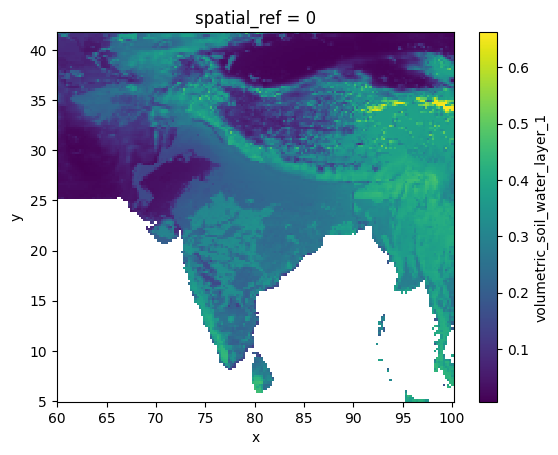

In [17]:
sm_yearly.volumetric_soil_water_layer_1.mean(dim='time').plot()

In [18]:
sm_yearly_anom = sm_yearly - sm_yearly.mean(dim='time')
pr_yearly_anom = pr_yearly - pr_yearly.mean(dim='time')

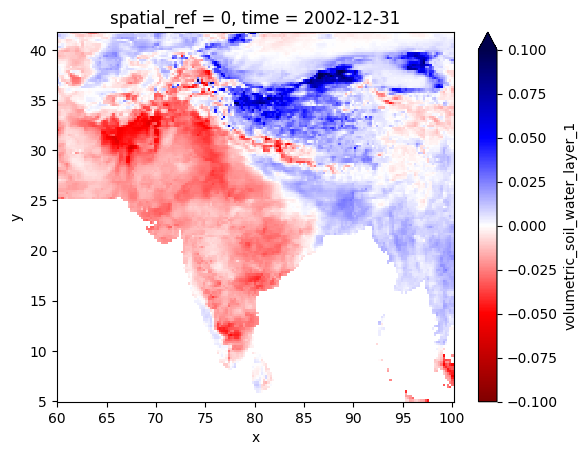

In [24]:
from datetime import time
sm_yearly_anom.volumetric_soil_water_layer_1.sel(time='2002').plot(vmin=-0.1, vmax=0.1, cmap='seismic_r')

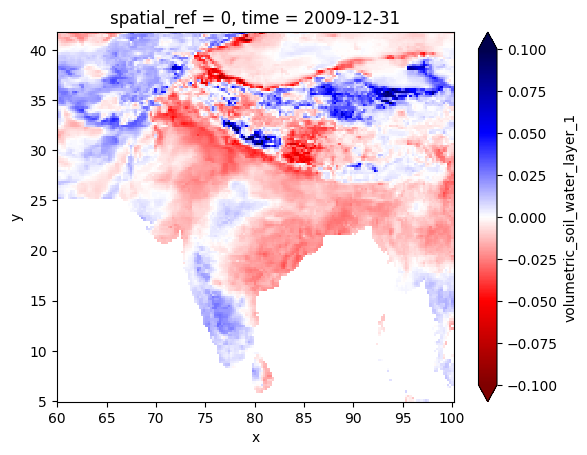

In [26]:
sm_yearly_anom.volumetric_soil_water_layer_1.sel(time='2009').plot(vmin=-0.1, vmax=0.1, cmap='seismic_r')

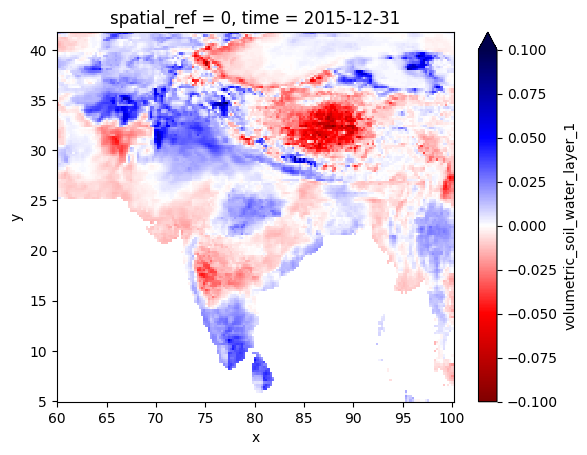

In [27]:
sm_yearly_anom.volumetric_soil_water_layer_1.sel(time='2015').plot(vmin=-0.1, vmax=0.1, cmap='seismic_r')

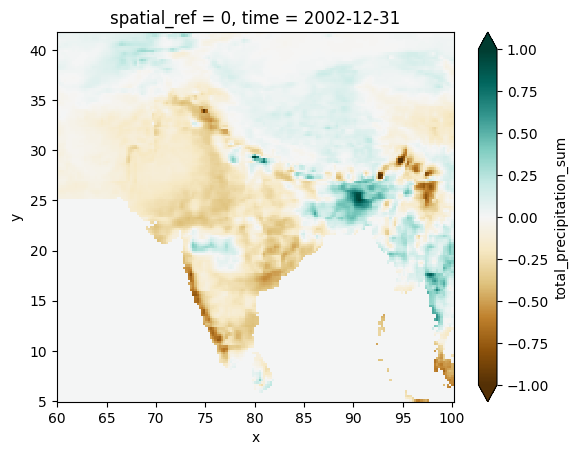

In [32]:
pr_yearly_anom.total_precipitation_sum.sel(time='2002').plot(vmin=-1.0, vmax=1.0, cmap='BrBG')

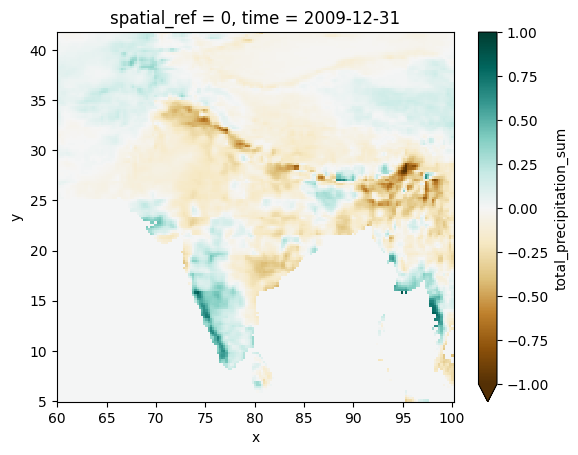

In [33]:
pr_yearly_anom.total_precipitation_sum.sel(time='2009').plot(vmin=-1.0, vmax=1.0, cmap='BrBG')

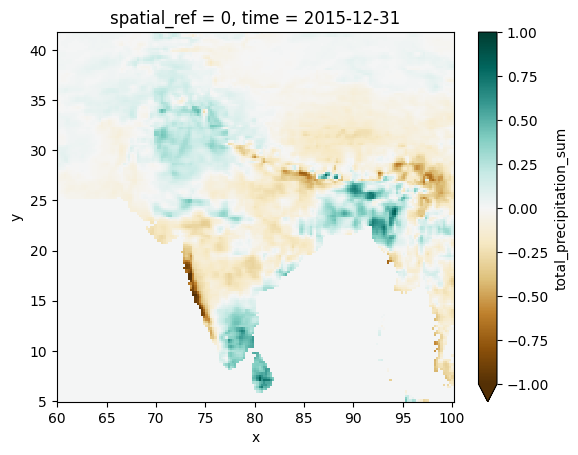

In [34]:
pr_yearly_anom.total_precipitation_sum.sel(time='2015').plot(vmin=-1.0, vmax=1.0, cmap='BrBG')

In [35]:
!pip install cartopy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 111.6 MB/s eta 0:00:00


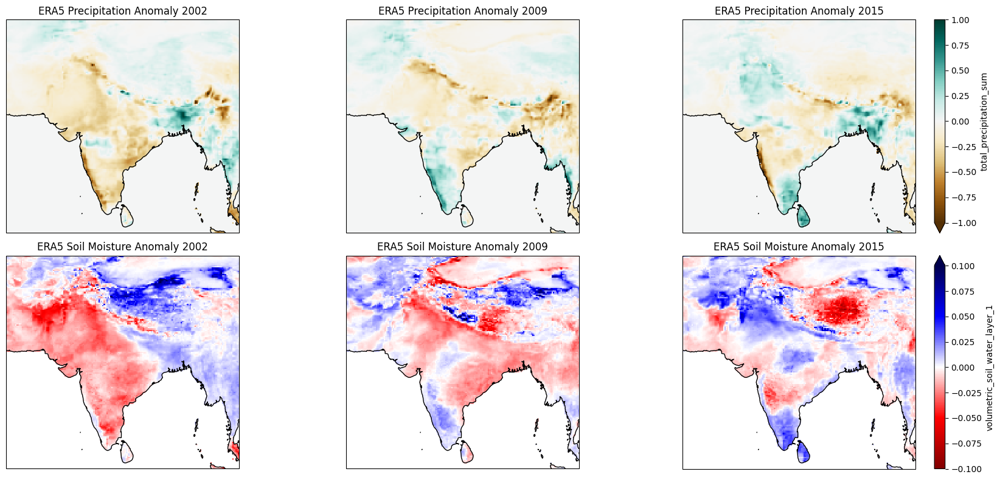

In [44]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io.shapereader import natural_earth, Reader

# Load Natural Earth country shapefile
shapefile = natural_earth(category='cultural', name='admin_0_countries', resolution='110m')
countries = Reader(shapefile).records()

# Extract only India's geometry
india_geom = [country.geometry for country in countries if country.attributes['ADMIN'] == 'India'][0]

# Define years and anomaly ranges
years = ['2002', '2009', '2015']
vmin_pr, vmax_pr = -1.0, 1.0
vmin_sm, vmax_sm = -0.1, 0.1

# Create the subplot grid
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 8),
                         subplot_kw={'projection': ccrs.PlateCarree()})

# First row: Precipitation anomalies
for i, year in enumerate(years):
    ax = axes[0, i]
    pr_yearly_anom.total_precipitation_sum.sel(time=year).plot(
        ax=ax,
        cmap='BrBG',
        vmin=vmin_pr,
        vmax=vmax_pr,
        add_colorbar=(i == 2),
        transform=ccrs.PlateCarree()
    )
    ax.set_title(f'ERA5 Precipitation Anomaly {year}')
    ax.coastlines()
    #ax.add_geometries([india_geom], crs=ccrs.PlateCarree(), facecolor='none', edgecolor='black', linewidth=1)

# Second row: Soil Moisture anomalies
for i, year in enumerate(years):
    ax = axes[1, i]
    sm_yearly_anom.volumetric_soil_water_layer_1.sel(time=year).plot(
        ax=ax,
        cmap='seismic_r',
        vmin=vmin_sm,
        vmax=vmax_sm,
        add_colorbar=(i == 2),
        transform=ccrs.PlateCarree()
    )
    ax.set_title(f'ERA5 Soil Moisture Anomaly {year}')
    ax.coastlines()
    #ax.add_geometries([india_geom], crs=ccrs.PlateCarree(), facecolor='none', edgecolor='black', linewidth=1)

# Adjust layout
plt.tight_layout()
plt.show()


<ipython-input-50-df3c9bb0d56a>:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for colorbars


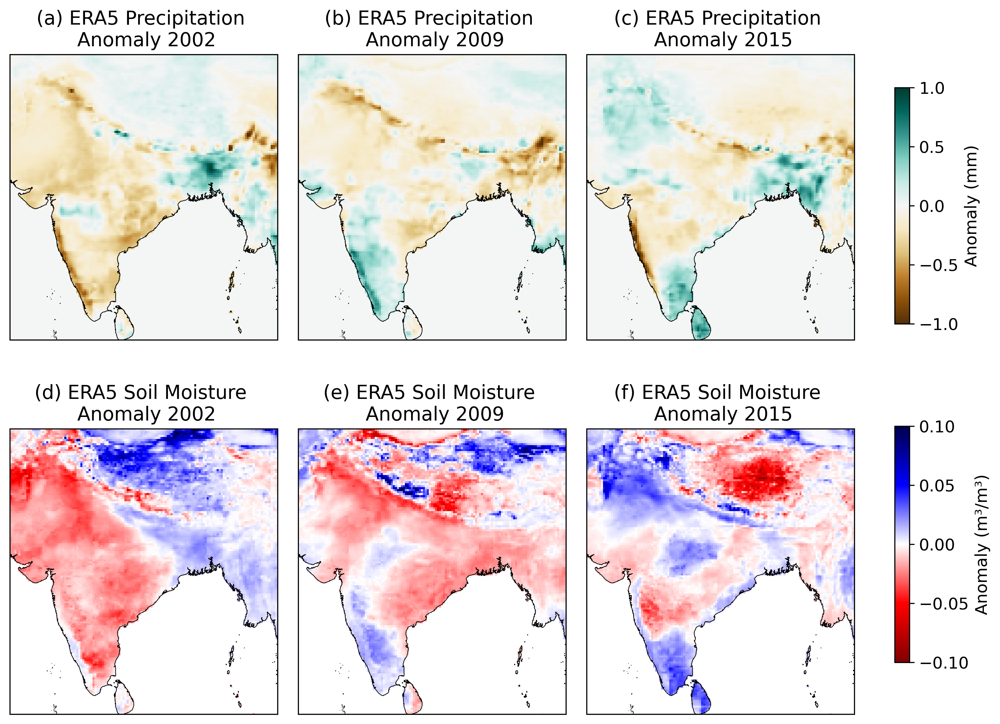

In [50]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io.shapereader import natural_earth, Reader

# Optional: Use this if publication requires high DPI vector output
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 16,
    'axes.labelsize': 14,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12
})

# Load Natural Earth country shapefile
shapefile = natural_earth(category='cultural', name='admin_0_countries', resolution='110m')
countries = Reader(shapefile).records()
india_geom = [country.geometry for country in countries if country.attributes['ADMIN'] == 'India'][0]

# Define years and anomaly ranges
years = ['2002', '2009', '2015']
vmin_pr, vmax_pr = -1.0, 1.0
vmin_sm, vmax_sm = -0.1, 0.1

# Create subplot grid
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(10, 8), dpi=300,
                         subplot_kw={'projection': ccrs.PlateCarree()})
letters = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)']

# Plot Precipitation (top row)
for i, year in enumerate(years):
    ax = axes[0, i]
    data = pr_yearly_anom.total_precipitation_sum.sel(time=year)
    im = data.plot(
        ax=ax, cmap='BrBG', vmin=vmin_pr, vmax=vmax_pr,
        add_colorbar=False, transform=ccrs.PlateCarree()
    )
    ax.set_title(f'{letters[i]} ERA5 Precipitation \n Anomaly {year}', fontsize=14)
    ax.coastlines(resolution='10m', linewidth=0.5)
    ax.set_extent([68, 98, 6, 38], crs=ccrs.PlateCarree())

# Add one shared colorbar for precipitation
cbar_ax = fig.add_axes([0.92, 0.56, 0.015, 0.3])  # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('Anomaly (mm)', fontsize=12)

# Plot Soil Moisture (bottom row)
for i, year in enumerate(years):
    ax = axes[1, i]
    data = sm_yearly_anom.volumetric_soil_water_layer_1.sel(time=year)
    im2 = data.plot(
        ax=ax, cmap='seismic_r', vmin=vmin_sm, vmax=vmax_sm,
        add_colorbar=False, transform=ccrs.PlateCarree()
    )
    ax.set_title(f'{letters[i+3]} ERA5 Soil Moisture \n Anomaly {year}', fontsize=14)
    ax.coastlines(resolution='10m', linewidth=0.5)
    ax.set_extent([68, 98, 6, 38], crs=ccrs.PlateCarree())

# Add one shared colorbar for soil moisture
cbar_ax2 = fig.add_axes([0.92, 0.13, 0.015, 0.3])  # [left, bottom, width, height]
cbar2 = fig.colorbar(im2, cax=cbar_ax2)
cbar2.set_label('Anomaly (m³/m³)', fontsize=12)

# Final layout
plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for colorbars
plt.show()

In [51]:
# Date range
start_year = 1979
end_year = 2024

# Empty lists to hold per-year data
sm_list = []
pr_list = []
lhf_list = []  # Latent heat flux
shf_list = []  # Sensible heat flux

# Loop through years
for year in range(start_year, end_year + 1):
    start_date = f'{year}-01-01'
    end_date = f'{year}-12-31'

    dataset = ee.ImageCollection('ECMWF/ERA5_LAND/MONTHLY_AGGR').filterDate(start_date, end_date)


    dataset_lhf = dataset.select('surface_latent_heat_flux_sum')
    dataset_shf = dataset.select('surface_sensible_heat_flux_sum')

    # Convert to xarray for each variable
    ds_lhf = dataset_lhf.wx.to_xarray(region=aoi.bounds(), scale=25000)
    ds_shf = dataset_shf.wx.to_xarray(region=aoi.bounds(), scale=25000)

    lhf_list.append(ds_lhf)
    shf_list.append(ds_shf)

# Concatenate all years by time dimension
combined_lhf = xr.concat(lhf_list, dim='time')
combined_shf = xr.concat(shf_list, dim='time')

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

In [53]:
lhf_yearly = combined_lhf.resample(time='1Y').mean()
shf_yearly = combined_shf.resample(time='1Y').sum()
lhf_yearly

/usr/local/lib/python3.11/dist-packages/xarray/groupers.py:490: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(
/usr/local/lib/python3.11/dist-packages/xarray/groupers.py:490: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(


<xarray.Dataset> Size: 11MB
Dimensions:                       (time: 46, y: 164, x: 179)
Coordinates:
  * x                             (x) float64 1kB 60.07 60.3 ... 99.83 100.0
  * y                             (y) float64 1kB 41.66 41.43 ... 5.278 5.053
    spatial_ref                   int64 8B 0
  * time                          (time) datetime64[ns] 368B 1979-12-31 ... 2...
Data variables:
    surface_latent_heat_flux_sum  (time, y, x) float64 11MB -3.642e+07 ... nan
Attributes:
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    AREA_OR_POINT:           Area
    _FillValue:              -32768.0
    scale_factor:            1.0
    add_offset:              0.0

In [55]:
lhf_yearly_anom = lhf_yearly - lhf_yearly.mean(dim='time')
shf_yearly_anom = shf_yearly - shf_yearly.mean(dim='time')

In [57]:
lhf_yearly_anom

<xarray.Dataset> Size: 11MB
Dimensions:                       (x: 179, y: 164, time: 46)
Coordinates:
  * x                             (x) float64 1kB 60.07 60.3 ... 99.83 100.0
  * y                             (y) float64 1kB 41.66 41.43 ... 5.278 5.053
    spatial_ref                   int64 8B 0
  * time                          (time) datetime64[ns] 368B 1979-12-31 ... 2...
Data variables:
    surface_latent_heat_flux_sum  (time, y, x) float64 11MB -1.03e+07 ... nan

<ipython-input-61-1b0c686c28a1>:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for colorbars


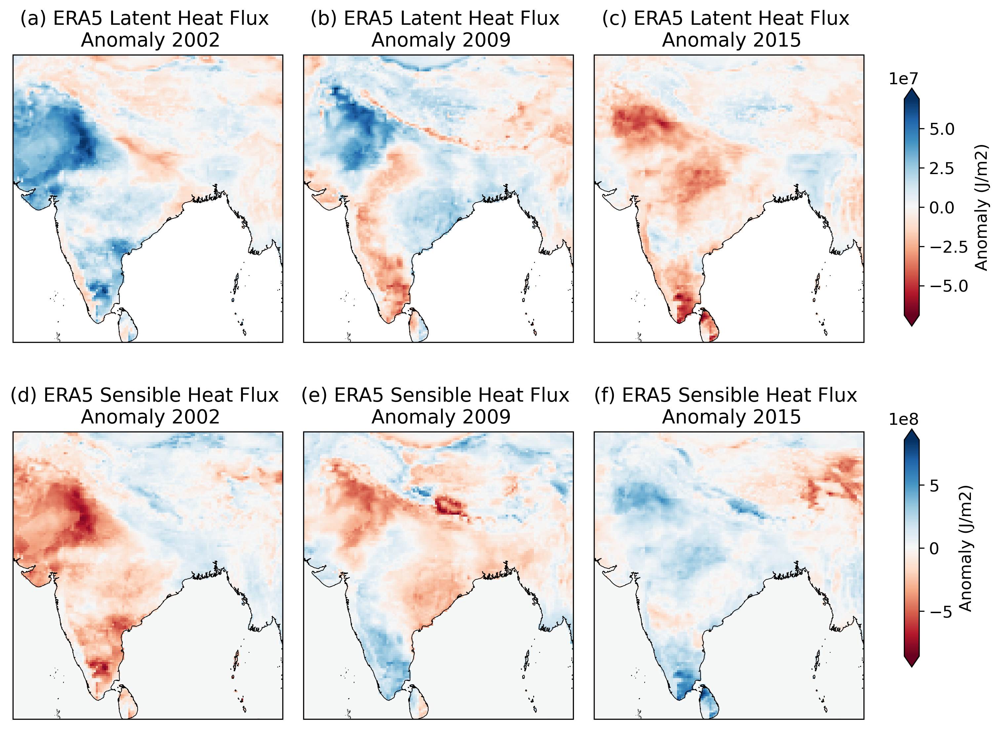

In [61]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io.shapereader import natural_earth, Reader

# Optional: Use this if publication requires high DPI vector output
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 16,
    'axes.labelsize': 14,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12
})

# Load Natural Earth country shapefile
shapefile = natural_earth(category='cultural', name='admin_0_countries', resolution='110m')
countries = Reader(shapefile).records()
india_geom = [country.geometry for country in countries if country.attributes['ADMIN'] == 'India'][0]

# Define years and anomaly ranges
years = ['2002', '2009', '2015']
vmin_pr, vmax_pr = -1.0, 1.0
vmin_sm, vmax_sm = -0.1, 0.1

# Create subplot grid
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(10, 8), dpi=300,
                         subplot_kw={'projection': ccrs.PlateCarree()})
letters = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)']

# Plot Precipitation (top row)
for i, year in enumerate(years):
    ax = axes[0, i]
    data = lhf_yearly_anom.surface_latent_heat_flux_sum.sel(time=year)
    im = data.plot(
        ax=ax, cmap='RdBu',
        add_colorbar=False, transform=ccrs.PlateCarree(), extend='both'
    )
    ax.set_title(f'{letters[i]} ERA5 Latent Heat Flux \n Anomaly {year}', fontsize=14)
    ax.coastlines(resolution='10m', linewidth=0.5)
    ax.set_extent([68, 98, 6, 38], crs=ccrs.PlateCarree())

# Add one shared colorbar for precipitation
cbar_ax = fig.add_axes([0.92, 0.56, 0.015, 0.3])  # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax, extend='both')
cbar.set_label('Anomaly (J/m2)', fontsize=12)

# Plot Soil Moisture (bottom row)
for i, year in enumerate(years):
    ax = axes[1, i]
    data = shf_yearly_anom.surface_sensible_heat_flux_sum.sel(time=year)
    im2 = data.plot(
        ax=ax, cmap='RdBu',
        add_colorbar=False, transform=ccrs.PlateCarree(), extend='both'
    )
    ax.set_title(f'{letters[i+3]} ERA5 Sensible Heat Flux \n Anomaly {year}', fontsize=14)
    ax.coastlines(resolution='10m', linewidth=0.5)
    ax.set_extent([68, 98, 6, 38], crs=ccrs.PlateCarree())

# Add one shared colorbar for soil moisture
cbar_ax2 = fig.add_axes([0.92, 0.13, 0.015, 0.3])  # [left, bottom, width, height]
cbar2 = fig.colorbar(im2, cax=cbar_ax2, extend='both')
cbar2.set_label('Anomaly (J/m2)', fontsize=12)

# Final layout
plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for colorbars
plt.show()

In [65]:
#surface_net_solar_radiation_sum
#total_evaporation_sum

# Date range
start_year = 1979
end_year = 2024

# Empty lists to hold per-year data
rns_list = []
evap_list = []

# Loop through years
for year in range(start_year, end_year + 1):
    start_date = f'{year}-01-01'
    end_date = f'{year}-12-31'

    dataset = ee.ImageCollection('ECMWF/ERA5_LAND/MONTHLY_AGGR').filterDate(start_date, end_date)


    dataset_rns = dataset.select('surface_net_solar_radiation_sum')
    dataset_evap = dataset.select('total_evaporation_sum')

    # Convert to xarray for each variable
    ds_rns = dataset_rns.wx.to_xarray(region=aoi.bounds(), scale=25000)
    ds_evap = dataset_evap.wx.to_xarray(region=aoi.bounds(), scale=25000)

    rns_list.append(ds_rns)
    evap_list.append(ds_evap)

# Concatenate all years by time dimension
combined_rns = xr.concat(rns_list, dim='time')
combined_evap = xr.concat(evap_list, dim='time')

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

In [66]:
combined_rns

<xarray.Dataset> Size: 130MB
Dimensions:                          (time: 552, y: 164, x: 179)
Coordinates:
  * time                             (time) datetime64[ns] 4kB 1979-01-01 ......
  * x                                (x) float64 1kB 60.07 60.3 ... 99.83 100.0
  * y                                (y) float64 1kB 41.66 41.43 ... 5.278 5.053
    spatial_ref                      int64 8B 0
Data variables:
    surface_net_solar_radiation_sum  (time, y, x) float64 130MB 1.981e+08 ......
Attributes:
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    AREA_OR_POINT:           Area
    _FillValue:              -32768.0
    scale_factor:            1.0
    add_offset:              0.0

In [67]:
rns_yearly = combined_rns.resample(time='1Y').mean()
evap_yearly = combined_evap.resample(time='1Y').sum()
rns_yearly

/usr/local/lib/python3.11/dist-packages/xarray/groupers.py:490: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(
/usr/local/lib/python3.11/dist-packages/xarray/groupers.py:490: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(


<xarray.Dataset> Size: 11MB
Dimensions:                          (time: 46, y: 164, x: 179)
Coordinates:
  * x                                (x) float64 1kB 60.07 60.3 ... 99.83 100.0
  * y                                (y) float64 1kB 41.66 41.43 ... 5.278 5.053
    spatial_ref                      int64 8B 0
  * time                             (time) datetime64[ns] 368B 1979-12-31 .....
Data variables:
    surface_net_solar_radiation_sum  (time, y, x) float64 11MB 4.079e+08 ... 0.0
Attributes:
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    AREA_OR_POINT:           Area
    _FillValue:              -32768.0
    scale_factor:            1.0
    add_offset:              0.0

In [68]:
rns_yearly_anom = rns_yearly - rns_yearly.mean(dim='time')
evap_yearly_anom = evap_yearly - evap_yearly.mean(dim='time')

In [70]:
evap_yearly_anom

<xarray.Dataset> Size: 11MB
Dimensions:                (x: 179, y: 164, time: 46)
Coordinates:
  * x                      (x) float64 1kB 60.07 60.3 60.52 ... 99.6 99.83 100.0
  * y                      (y) float64 1kB 41.66 41.43 41.21 ... 5.278 5.053
    spatial_ref            int64 8B 0
  * time                   (time) datetime64[ns] 368B 1979-12-31 ... 2024-12-31
Data variables:
    total_evaporation_sum  (time, y, x) float64 11MB -0.04938 -0.04889 ... 0.0

<ipython-input-72-4c7c0fcd7ea1>:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for colorbars


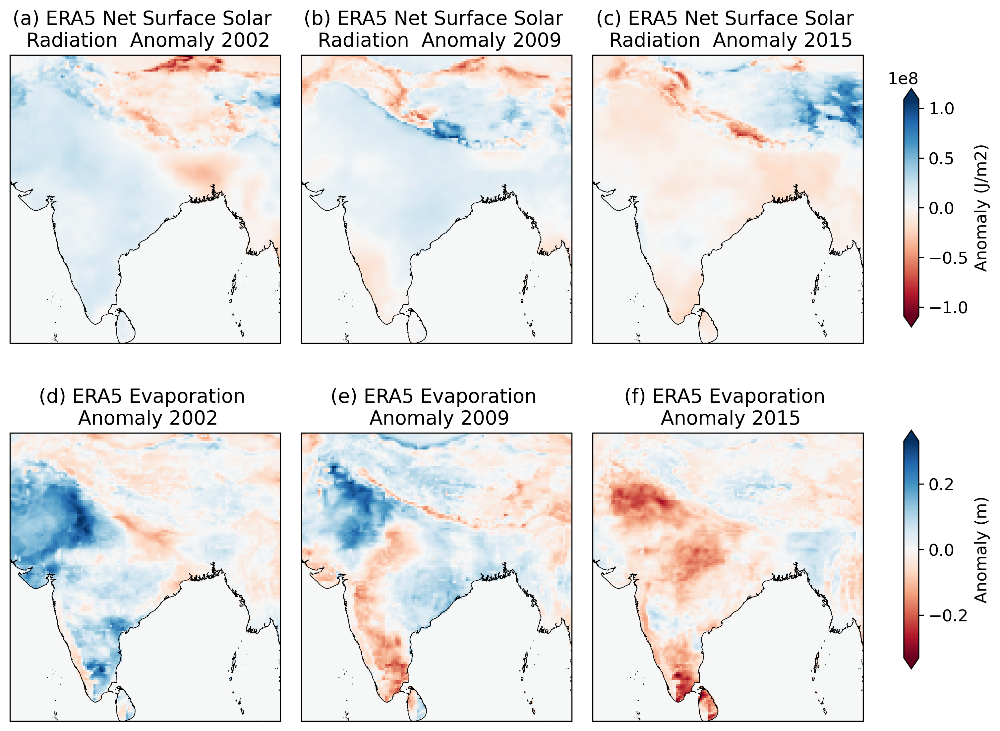

In [72]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io.shapereader import natural_earth, Reader

# Optional: Use this if publication requires high DPI vector output
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 16,
    'axes.labelsize': 14,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12
})

# Load Natural Earth country shapefile
shapefile = natural_earth(category='cultural', name='admin_0_countries', resolution='110m')
countries = Reader(shapefile).records()
india_geom = [country.geometry for country in countries if country.attributes['ADMIN'] == 'India'][0]

# Define years and anomaly ranges
years = ['2002', '2009', '2015']
vmin_pr, vmax_pr = -1.0, 1.0
vmin_sm, vmax_sm = -0.1, 0.1

# Create subplot grid
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(10, 8), dpi=300,
                         subplot_kw={'projection': ccrs.PlateCarree()})
letters = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)']

# Plot Precipitation (top row)
for i, year in enumerate(years):
    ax = axes[0, i]
    data = rns_yearly_anom.surface_net_solar_radiation_sum.sel(time=year)
    im = data.plot(
        ax=ax, cmap='RdBu',
        add_colorbar=False, transform=ccrs.PlateCarree(), extend='both'
    )
    ax.set_title(f'{letters[i]} ERA5 Net Surface Solar \n Radiation  Anomaly {year}', fontsize=14)
    ax.coastlines(resolution='10m', linewidth=0.5)
    ax.set_extent([68, 98, 6, 38], crs=ccrs.PlateCarree())

# Add one shared colorbar for precipitation
cbar_ax = fig.add_axes([0.92, 0.56, 0.015, 0.3])  # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax, extend='both')
cbar.set_label('Anomaly (J/m2)', fontsize=12)

# Plot Soil Moisture (bottom row)
for i, year in enumerate(years):
    ax = axes[1, i]
    data = evap_yearly_anom.total_evaporation_sum.sel(time=year)
    im2 = data.plot(
        ax=ax, cmap='RdBu',
        add_colorbar=False, transform=ccrs.PlateCarree(), extend='both'
    )
    ax.set_title(f'{letters[i+3]} ERA5 Evaporation \n Anomaly {year}', fontsize=14)
    ax.coastlines(resolution='10m', linewidth=0.5)
    ax.set_extent([68, 98, 6, 38], crs=ccrs.PlateCarree())

# Add one shared colorbar for soil moisture
cbar_ax2 = fig.add_axes([0.92, 0.13, 0.015, 0.3])  # [left, bottom, width, height]
cbar2 = fig.colorbar(im2, cax=cbar_ax2, extend='both')
cbar2.set_label('Anomaly (m)', fontsize=12)

# Final layout
plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for colorbars
plt.show()

In [73]:
#temperature_2m

#surface_net_solar_radiation_sum
#total_evaporation_sum

# Date range
start_year = 1979
end_year = 2024

# Empty lists to hold per-year data
t2m_list = []


# Loop through years
for year in range(start_year, end_year + 1):
    start_date = f'{year}-01-01'
    end_date = f'{year}-12-31'

    dataset = ee.ImageCollection('ECMWF/ERA5_LAND/MONTHLY_AGGR').filterDate(start_date, end_date)


    dataset_t2m = dataset.select('temperature_2m')

    # Convert to xarray for each variable
    ds_t2m = dataset_t2m.wx.to_xarray(region=aoi.bounds(), scale=25000)

    t2m_list.append(ds_t2m)

# Concatenate all years by time dimension
combined_t2m = xr.concat(t2m_list, dim='time')

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

Requesting data:   0%|          | 0/12 [00:00<?, ?it/s]

In [74]:
t2m_yearly = combined_t2m.resample(time='1Y').mean()
t2m_yearly

/usr/local/lib/python3.11/dist-packages/xarray/groupers.py:490: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(


<xarray.Dataset> Size: 11MB
Dimensions:         (time: 46, y: 164, x: 179)
Coordinates:
  * x               (x) float64 1kB 60.07 60.3 60.52 60.75 ... 99.6 99.83 100.0
  * y               (y) float64 1kB 41.66 41.43 41.21 ... 5.502 5.278 5.053
    spatial_ref     int64 8B 0
  * time            (time) datetime64[ns] 368B 1979-12-31 ... 2024-12-31
Data variables:
    temperature_2m  (time, y, x) float64 11MB 287.2 287.2 287.2 ... nan nan nan
Attributes:
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    AREA_OR_POINT:           Area
    _FillValue:              -32768.0
    scale_factor:            1.0
    add_offset:              0.0

In [76]:
t2m_yearly_anom = t2m_yearly - t2m_yearly.mean(dim='time')
t2m_yearly_anom

<xarray.Dataset> Size: 11MB
Dimensions:         (x: 179, y: 164, time: 46)
Coordinates:
  * x               (x) float64 1kB 60.07 60.3 60.52 60.75 ... 99.6 99.83 100.0
  * y               (y) float64 1kB 41.66 41.43 41.21 ... 5.502 5.278 5.053
    spatial_ref     int64 8B 0
  * time            (time) datetime64[ns] 368B 1979-12-31 ... 2024-12-31
Data variables:
    temperature_2m  (time, y, x) float64 11MB -0.05592 0.01021 ... nan nan

<ipython-input-83-bd48b36b8b6f>:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for colorbars


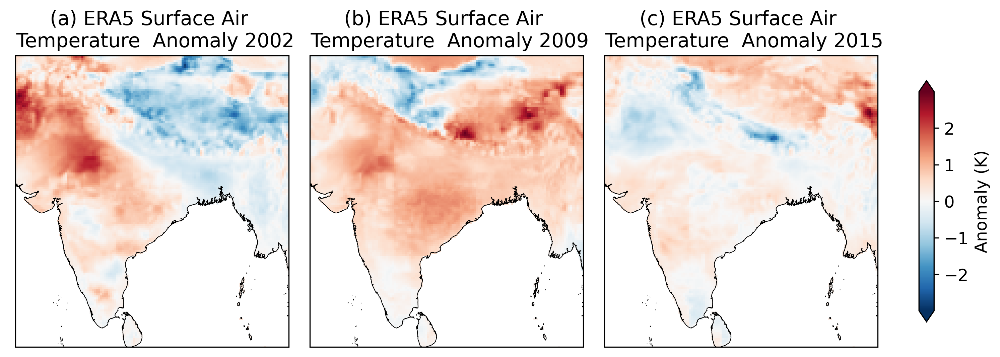

In [83]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io.shapereader import natural_earth, Reader

# Optional: Use this if publication requires high DPI vector output
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 16,
    'axes.labelsize': 14,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12
})

# Load Natural Earth country shapefile
shapefile = natural_earth(category='cultural', name='admin_0_countries', resolution='110m')
countries = Reader(shapefile).records()
india_geom = [country.geometry for country in countries if country.attributes['ADMIN'] == 'India'][0]

# Define years and anomaly ranges
years = ['2002', '2009', '2015']
vmin_pr, vmax_pr = -1.0, 1.0
vmin_sm, vmax_sm = -0.1, 0.1

# Create subplot grid
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 8), dpi=300,
                         subplot_kw={'projection': ccrs.PlateCarree()})
letters = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)']

# Plot Precipitation (top row)
for i, year in enumerate(years):
    ax = axes[i]
    data = t2m_yearly_anom.temperature_2m.sel(time=year)
    im = data.plot(
        ax=ax, cmap='RdBu_r',
        add_colorbar=False, transform=ccrs.PlateCarree(), extend='both'
    )
    ax.set_title(f'{letters[i]} ERA5 Surface Air \n Temperature  Anomaly {year}', fontsize=14)
    ax.coastlines(resolution='10m', linewidth=0.5)
    ax.set_extent([68, 98, 6, 38], crs=ccrs.PlateCarree())

# Add one shared colorbar for precipitation
cbar_ax = fig.add_axes([0.92, 0.35, 0.015, 0.3])  # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax, extend='both')
cbar.set_label('Anomaly (K)', fontsize=12)


# Final layout
plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for colorbars
plt.show()